##### Copyright 2023 The MediaPipe Authors. All Rights Reserved.

In [2]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Face Landmarks Detection with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to detect face landmarks from images.

## Preparation

Let's start with installing MediaPipe.

In [3]:
!pip install -q mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 93.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 10.8 MB/s eta 0:00:00


Then download the off-the-shelf model bundle(s). Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/face_landmarker#models) for more information about these model bundles.

In [4]:
!wget -O face_landmarker_v2_with_blendshapes.task -q https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task

## Visualization utilities

In [5]:
#@markdown We implemented some functions to visualize the face landmark detection results. <br/> Run the following cell to activate the functions.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from mediapipe.tasks.python.vision import drawing_utils
from mediapipe.tasks.python.vision import drawing_styles
import numpy as np
import matplotlib.pyplot as plt


def draw_landmarks_on_image(rgb_image, detection_result):
  face_landmarks_list = detection_result.face_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected faces to visualize.
  for idx in range(len(face_landmarks_list)):
    face_landmarks = face_landmarks_list[idx]

    # Draw the face landmarks.


    drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks,
        connections=vision.FaceLandmarksConnections.FACE_LANDMARKS_TESSELATION,
        landmark_drawing_spec=None,
        connection_drawing_spec=drawing_styles.get_default_face_mesh_tesselation_style())
    drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks,
        connections=vision.FaceLandmarksConnections.FACE_LANDMARKS_CONTOURS,
        landmark_drawing_spec=None,
        connection_drawing_spec=drawing_styles.get_default_face_mesh_contours_style())
    drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks,
        connections=vision.FaceLandmarksConnections.FACE_LANDMARKS_LEFT_IRIS,
          landmark_drawing_spec=None,
          connection_drawing_spec=drawing_styles.get_default_face_mesh_iris_connections_style())
    drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks,
        connections=vision.FaceLandmarksConnections.FACE_LANDMARKS_RIGHT_IRIS,
          landmark_drawing_spec=None,
          connection_drawing_spec=drawing_styles.get_default_face_mesh_iris_connections_style())

  return annotated_image

def plot_face_blendshapes_bar_graph(face_blendshapes):
  # Extract the face blendshapes category names and scores.
  face_blendshapes_names = [face_blendshapes_category.category_name for face_blendshapes_category in face_blendshapes]
  face_blendshapes_scores = [face_blendshapes_category.score for face_blendshapes_category in face_blendshapes]
  # The blendshapes are ordered in decreasing score value.
  face_blendshapes_ranks = range(len(face_blendshapes_names))

  fig, ax = plt.subplots(figsize=(12, 12))
  bar = ax.barh(face_blendshapes_ranks, face_blendshapes_scores, label=[str(x) for x in face_blendshapes_ranks])
  ax.set_yticks(face_blendshapes_ranks, face_blendshapes_names)
  ax.invert_yaxis()

  # Label each bar with values
  for score, patch in zip(face_blendshapes_scores, bar.patches):
    plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{score:.4f}", va="top")

  ax.set_xlabel('Score')
  ax.set_title("Face Blendshapes")
  plt.tight_layout()
  plt.show()

## Download test image

Let's grab a test image that we'll use later. The image is from [Unsplash](https://unsplash.com/photos/mt2fyrdXxzk).

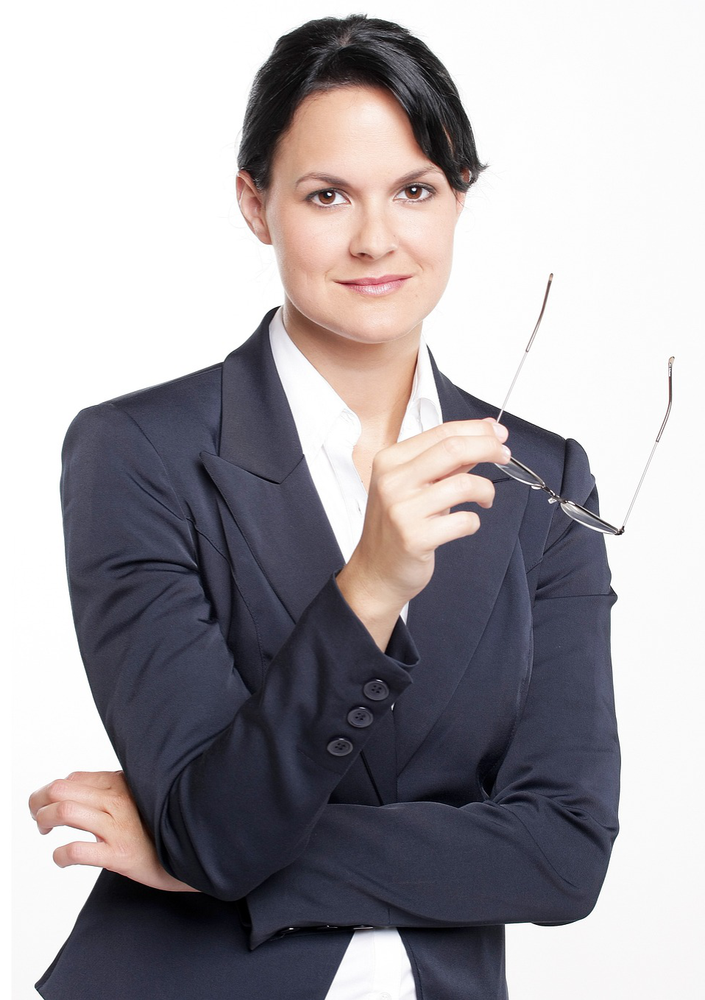

In [6]:
!wget -q -O image.png https://storage.googleapis.com/mediapipe-assets/business-person.png

import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("image.png")
cv2_imshow(img)

Optionally, you can upload your own image. If you want to do so, uncomment and run the cell below.

In [7]:
# from google.colab import files
# uploaded = files.upload()

# for filename in uploaded:
#   content = uploaded[filename]
#   with open(filename, 'wb') as f:
#     f.write(content)

# if len(uploaded.keys()):
#   IMAGE_FILE = next(iter(uploaded))
#   print('Uploaded file:', IMAGE_FILE)

## Running inference and visualizing the results

Here are the steps to run face landmark detection using MediaPipe.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/face_landmarker/python) to learn more about configuration options that this task supports.


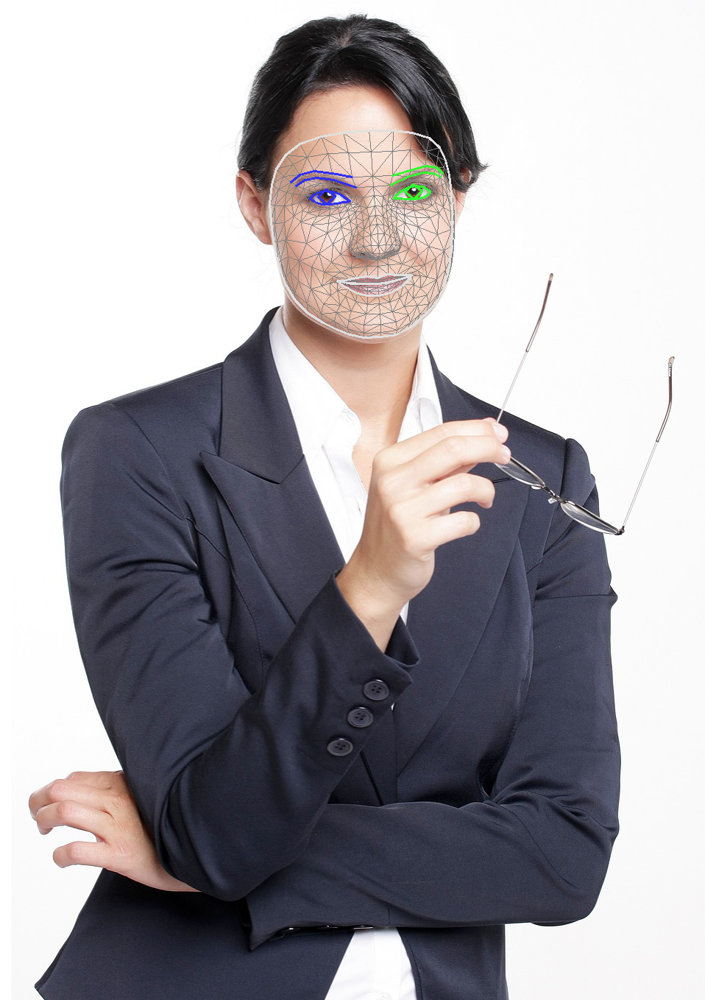

In [16]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# STEP 2: Create an FaceLandmarker object.
base_options = python.BaseOptions(model_asset_path='face_landmarker_v2_with_blendshapes.task')
options = vision.FaceLandmarkerOptions(base_options=base_options,
                                       output_face_blendshapes=False, # Changed to False
                                       output_facial_transformation_matrixes=True,
                                       num_faces=1)
detector = vision.FaceLandmarker.create_from_options(options)

# STEP 3: Load the input image.
image = mp.Image.create_from_file("image.png")

# STEP 4: Detect face landmarks from the input image.
detection_result = detector.detect(image)

# STEP 5: Process the detection result. In this case, visualize it.
annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result)
cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))

In [9]:
print(detection_result.facial_transformation_matrixes)

[array([[ 9.9220991e-01, -6.0496215e-02,  1.0890320e-01,  1.1874995e+00],
       [ 9.1046274e-02,  9.4880694e-01, -3.0245045e-01,  2.2372398e+01],
       [-8.5030966e-02,  3.1000933e-01,  9.4692349e-01, -6.8014664e+01],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],
      dtype=float32)]


Translation X: 1.187
Translation Y: 22.372
Translation Z: -68.015


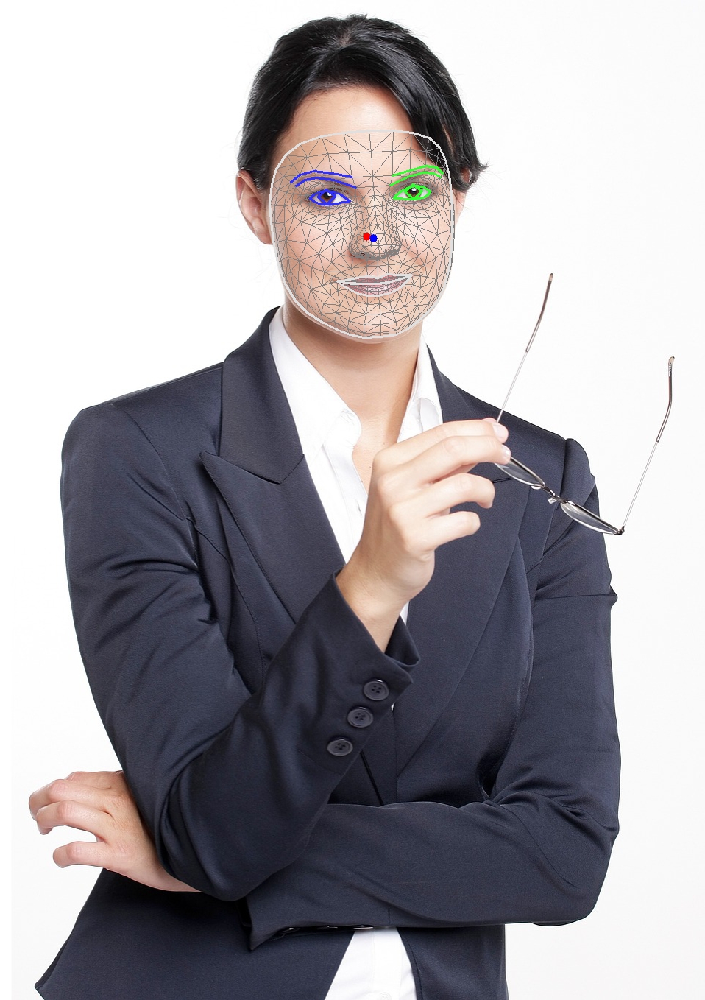

In [10]:
import cv2
import numpy as np

# Extract the transformation matrix for reference
transformation_matrix = detection_result.facial_transformation_matrixes[0]
Tx = transformation_matrix[0, 3]
Ty = transformation_matrix[1, 3]
Tz = transformation_matrix[2, 3]

print(f"Translation X: {Tx:.3f}")
print(f"Translation Y: {Ty:.3f}")
print(f"Translation Z: {Tz:.3f}")

# Get image dimensions from the original image object
# image is an mp.Image object, get its numpy view to get shape
image_height, image_width, _ = image.numpy_view().shape

# Assuming the camera's optical center is at the center of the image.
# Tx and Ty are offsets from this center in model units.

# A scaling factor is needed to convert model units (of Tx, Ty) to pixels.
scaling_factor = 16.0

# Calculate the pixel coordinates
center_x_pixel = int(image_width / 2 + Tx * scaling_factor)
center_y_pixel = int(image_height / 2 - Ty * scaling_factor)

# --- Previous landmark averaging approach (commented out) ---

face_landmarks = detection_result.face_landmarks[0] # Assuming only one face

avg_x = sum(lm.x for lm in face_landmarks) / len(face_landmarks)
avg_y = sum(lm.y for lm in face_landmarks) / len(face_landmarks)

# Convert normalized coordinates to pixel coordinates
center_x_pixel_from_average = int(avg_x * image_width)
center_y_pixel_from_average = int(avg_y * image_height)

# Draw a red circle at the calculated 2D center
# Use the already annotated image from previous steps
annotated_image_with_dot = np.copy(annotated_image) # Make a copy to avoid modifying original if it's reused
# Drawing a filled red circle (BGR: (0, 0, 255) for red), radius 5
cv2.circle(annotated_image_with_dot, (center_x_pixel, center_y_pixel), 5, (255, 0, 0), -1)
cv2.circle(annotated_image_with_dot, (center_x_pixel_from_average, center_y_pixel_from_average), 5, (0, 0, 255), -1)

# Display the image with the red dot
cv2_imshow(cv2.cvtColor(annotated_image_with_dot, cv2.COLOR_RGB2BGR))

# Handle case where no face is detected (though unlikely with this logic)
if not detection_result.face_landmarks:
    print("No face detected, so no dot drawn using transformation matrix values.")

In [11]:
print("All Face Landmarks (x, y, z):")
if detection_result.face_landmarks:
    all_landmarks = []
    for face_landmark_list in detection_result.face_landmarks:
        for i, landmark in enumerate(face_landmark_list):
            all_landmarks.append({'landmark_id': i, 'x': landmark.x, 'y': landmark.y, 'z': landmark.z})

    # Display as a DataFrame for better readability if pandas is available
    try:
        import pandas as pd
        df_landmarks = pd.DataFrame(all_landmarks)
        display(df_landmarks)
    except ImportError:
        # Fallback to simple print if pandas is not installed
        for lm in all_landmarks:
            print(f"ID: {lm['landmark_id']}, x: {lm['x']:.4f}, y: {lm['y']:.4f}, z: {lm['z']:.4f}")
else:
    print("No face landmarks detected.")

All Face Landmarks (x, y, z):


,landmark_id,x,y,z
0,0,0.536446,0.277635,-0.022394
1,1,0.537939,0.253710,-0.061883
2,2,0.536248,0.259819,-0.028651
3,3,0.525050,0.225755,-0.053792
4,4,0.537517,0.245490,-0.067603
...,...,...,...,...
473,473,0.586500,0.191718,-0.000182
474,474,0.598394,0.191136,-0.000235
475,475,0.585757,0.184409,-0.000234
476,476,0.574493,0.192187,-0.000247


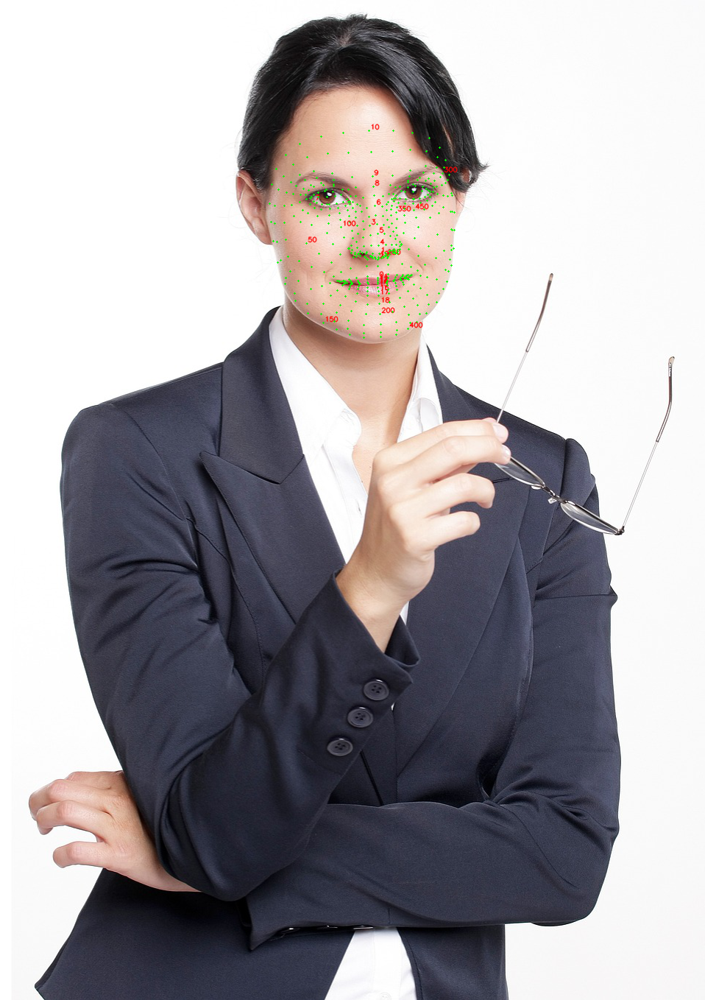

In [12]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Make a copy of the original image to draw on
image_to_annotate = np.copy(image.numpy_view())
image_height, image_width, _ = image_to_annotate.shape

if detection_result.face_landmarks:
    face_landmarks = detection_result.face_landmarks[0]

    for i, landmark in enumerate(face_landmarks):
        # Convert normalized coordinates to pixel coordinates
        px = int(landmark.x * image_width)
        py = int(landmark.y * image_height)

        # Draw a small circle for each landmark
        cv2.circle(image_to_annotate, (px, py), 1, (0, 255, 0), -1) # Green dot

        # Add landmark index as text for a subset of landmarks
        # For example, the first 20 landmarks and then every 50th landmark
        if i < 20 or (i % 50 == 0 and i != 0): # Avoid 0 if already covered by i < 20
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.3 # Very small font scale
            font_thickness = 1
            text_color = (255, 0, 0) # Blue color for text
            cv2.putText(image_to_annotate, str(i), (px + 2, py - 2), font, font_scale, text_color, font_thickness, cv2.LINE_AA)

    # Display the annotated image
    cv2_imshow(cv2.cvtColor(image_to_annotate, cv2.COLOR_RGB2BGR))
else:
    print("No face detected to annotate with landmarks.")

The landmark closest to the transformation matrix's 2D center is Landmark ID: 134
  Transformation Matrix Center (Pixel): (498, 321)
  Closest Landmark (Pixel): (493, 322)
  Distance: 5.10 pixels


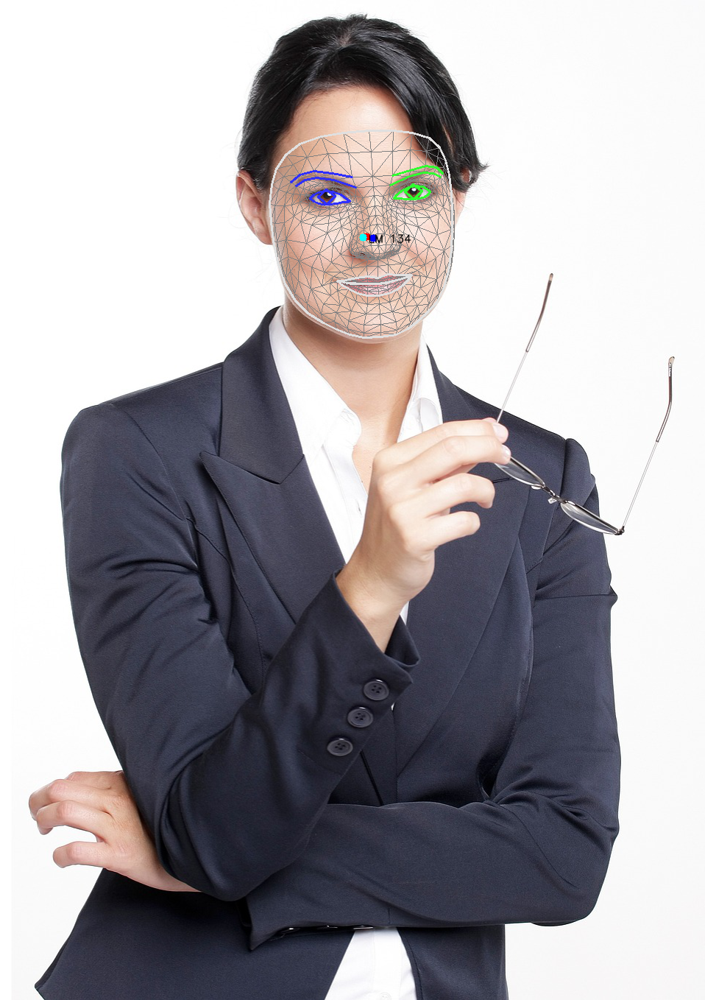

In [13]:
import math

# Reuse the pixel coordinates calculated from the transformation matrix in cell nBCfSsmRBsK7
# center_x_pixel = int(image_width / 2 + Tx * scaling_factor)
# center_y_pixel = int(image_height / 2 - Ty * scaling_factor)

if 'center_x_pixel' not in locals() or 'center_y_pixel' not in locals():
    # Recalculate if the variables are not available (e.g., if previous cells were skipped)
    transformation_matrix = detection_result.facial_transformation_matrixes[0]
    Tx = transformation_matrix[0, 3]
    Ty = transformation_matrix[1, 3]
    Tz = transformation_matrix[2, 3]
    image_height, image_width, _ = image.numpy_view().shape
    scaling_factor = 16.0
    center_x_pixel = int(image_width / 2 + Tx * scaling_factor)
    center_y_pixel = int(image_height / 2 - Ty * scaling_factor)

min_distance = float('inf')
closest_landmark_id = -1
closest_landmark_pixel_x = -1
closest_landmark_pixel_y = -1

if detection_result.face_landmarks:
    face_landmarks = detection_result.face_landmarks[0]

    for i, landmark in enumerate(face_landmarks):
        # Convert normalized landmark coordinates to pixel coordinates
        landmark_px = int(landmark.x * image_width)
        landmark_py = int(landmark.y * image_height)

        # Calculate Euclidean distance
        distance = math.sqrt((center_x_pixel - landmark_px)**2 + (center_y_pixel - landmark_py)**2)

        if distance < min_distance:
            min_distance = distance
            closest_landmark_id = i
            closest_landmark_pixel_x = landmark_px
            closest_landmark_pixel_y = landmark_py

    print(f"The landmark closest to the transformation matrix's 2D center is Landmark ID: {closest_landmark_id}")
    print(f"  Transformation Matrix Center (Pixel): ({center_x_pixel}, {center_y_pixel})")
    print(f"  Closest Landmark (Pixel): ({closest_landmark_pixel_x}, {closest_landmark_pixel_y})")
    print(f"  Distance: {min_distance:.2f} pixels")

    # Draw the transformation matrix point (red), average landmark point (blue), and closest landmark (yellow)
    # Use the annotated_image_with_dot from cell nBCfSsmRBsK7 as the base
    image_with_closest_landmark = np.copy(annotated_image_with_dot)

    # Draw the closest landmark in yellow (BGR: (0, 255, 255))
    cv2.circle(image_with_closest_landmark, (closest_landmark_pixel_x, closest_landmark_pixel_y), 5, (0, 255, 255), -1)

    # Add text label for the closest landmark
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    font_thickness = 1
    text_color = (0, 0, 0) # Black text
    cv2.putText(image_with_closest_landmark, f"LM {closest_landmark_id}", (closest_landmark_pixel_x + 7, closest_landmark_pixel_y + 7), font, font_scale, text_color, font_thickness, cv2.LINE_AA)

    # Display the image
    cv2_imshow(cv2.cvtColor(image_with_closest_landmark, cv2.COLOR_RGB2BGR))
else:
    print("No face detected to find the closest landmark.")

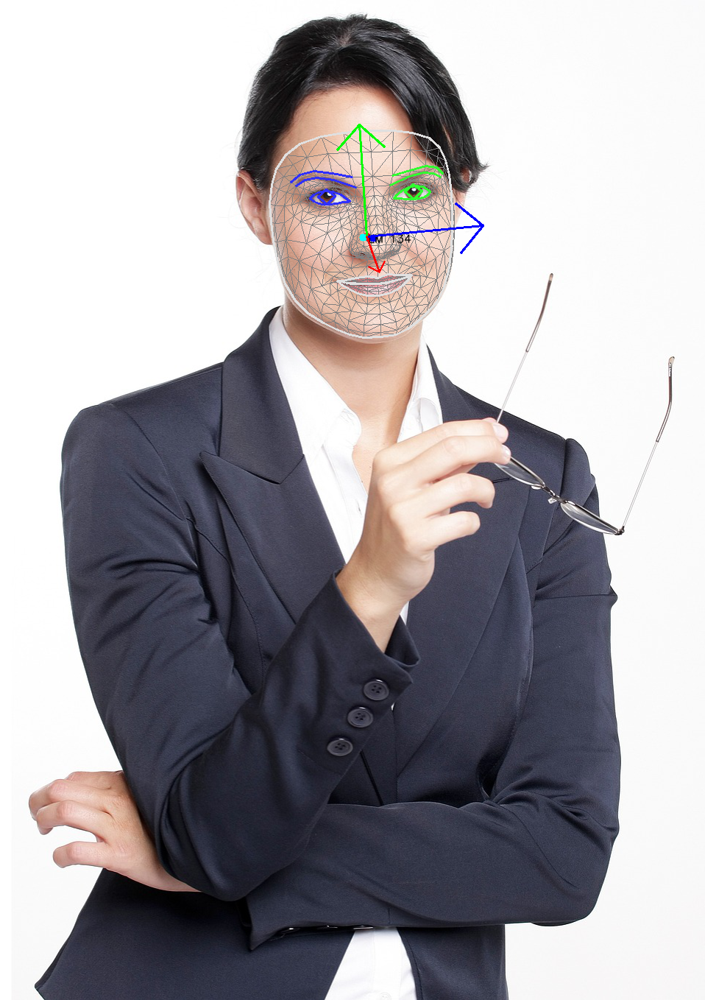

In [14]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Make a copy of the image from the previous step which includes all previous annotations
image_with_axes = np.copy(image_with_closest_landmark)

# Ensure relevant variables are available (re-calculate if necessary)
if 'Tx' not in locals() or 'Ty' not in locals() or 'Tz' not in locals() or 'scaling_factor' not in locals():
    transformation_matrix = detection_result.facial_transformation_matrixes[0]
    Tx = transformation_matrix[0, 3]
    Ty = transformation_matrix[1, 3]
    Tz = transformation_matrix[2, 3]
    image_height, image_width, _ = image.numpy_view().shape
    scaling_factor = 16.0 # Re-use the estimated scaling factor
    center_x_pixel = int(image_width / 2 + Tx * scaling_factor)
    center_y_pixel = int(image_height / 2 - Ty * scaling_factor)

# Extract rotation matrix (R) from the transformation matrix
transformation_matrix = detection_result.facial_transformation_matrixes[0]
R = transformation_matrix[:3, :3]

# Define axis vectors in 3D model space (e.g., unit vectors)
axis_length_model = 10.0 # Arbitrary length in model units for visualization
axis_x_3d = np.array([axis_length_model, 0, 0])
axis_y_3d = np.array([0, axis_length_model, 0])
axis_z_3d = np.array([0, 0, axis_length_model])

# Rotate the axis vectors using the extracted rotation matrix
rotated_axis_x = R @ axis_x_3d
rotated_axis_y = R @ axis_y_3d
rotated_axis_z = R @ axis_z_3d

# Convert the rotated axis vectors to pixel offsets using the scaling factor.
# Note: Y-axis in image coordinates typically points down, while model Y might point up,
# hence the negative sign for the Y component of the pixel offset.

end_x_axis_pixel = (int(center_x_pixel + rotated_axis_x[0] * scaling_factor),
                    int(center_y_pixel - rotated_axis_x[1] * scaling_factor))
end_y_axis_pixel = (int(center_x_pixel + rotated_axis_y[0] * scaling_factor),
                    int(center_y_pixel - rotated_axis_y[1] * scaling_factor))
end_z_axis_pixel = (int(center_x_pixel + rotated_axis_z[0] * scaling_factor),
                    int(center_y_pixel - rotated_axis_z[1] * scaling_factor))

# Draw the axes as arrows on the image
# Colors are in BGR format for OpenCV:
# Red for X-axis (0, 0, 255)
# Green for Y-axis (0, 255, 0)
# Blue for Z-axis (255, 0, 0)
cv2.arrowedLine(image_with_axes, (center_x_pixel, center_y_pixel), end_x_axis_pixel, (0, 0, 255), 2, tipLength=0.3)
cv2.arrowedLine(image_with_axes, (center_x_pixel, center_y_pixel), end_y_axis_pixel, (0, 255, 0), 2, tipLength=0.3)
cv2.arrowedLine(image_with_axes, (center_x_pixel, center_y_pixel), end_z_axis_pixel, (255, 0, 0), 2, tipLength=0.3)

# Display the image with the 3D coordinate system
cv2_imshow(cv2.cvtColor(image_with_axes, cv2.COLOR_RGB2BGR))